# **D2K Team Audubon Spring 2023 Software Demo**

This notebook contains a demonstration for training bird detection and classification models for UAV images provided by Houston Audubon. Created by students from the spring 2023 D2K capstone project course at Rice University.

The notebook is divided into four parts:
  1. Installation 
  2. Data processing and exploration
  3. Training a bird detection model
  4. Training a bird species classification model

### Part 1 - Installation and Setup for Colab

In [ ]:
# Download data from dropbox
!wget https://www.dropbox.com/s/xi6ipd06nqyq3k5/database.zip --quiet
!unzip -q ./database.zip

In [ ]:
# Clone Github repository
!git clone -b avialert https://github.com/RiceD2KLab/Audubon_F21.git --quiet

In [ ]:
# Go to the github repository
%cd Audubon_F21

/content/Audubon_F21


In [ ]:
# Install dependencies that Colab does not have
!pip install -r requirements.txt --quiet

In [ ]:
import pandas as pd
from PIL import Image
from update_database import update_database
from train_detector import train_detector_pipeline
from train_classifier import train_classifier_pipline
from config import CLASSIFIER_PATH, CONFIG_CLASSIFIER, HYPERPARAMS_CLASSIFIER
from config import CLF_TRAIN_PATH, CLF_VAL_PATH, CROPPED_PATH, DEVICE, PLOTS_PATH, DATA_PATH
from config import CONFIG_DETECTOR, SEED, HYPERPARAMS_DETECTOR, BIRD_ONLY
from config import DETECTOR_PATH, TILED_NEW_CSV_PATH, TILED_IMG_PATH, DPI

## Part 2 - Data Processing and Exploration

Here's a look at an entire drone image paired with its annotations:

In [ ]:
pd.read_csv('/content/database/detection/raw_data/annotations_xywh/DJI_20210517104803_0029.csv').head(10)

,class_id,desc,x,y,width,height
0,BCNHA,Black-Crowned Night Heron Adult,4284,828,73,108
1,BCNHA,Black-Crowned Night Heron Adult,4244,883,101,63
2,BCNHA,Black-Crowned Night Heron Adult,3936,771,93,91
3,BCNHA,Black-Crowned Night Heron Adult,3835,807,57,99
4,BCNHA,Black-Crowned Night Heron Adult,370,518,68,57
5,BCNHA,Black-Crowned Night Heron Adult,488,548,48,76
6,BCNHA,Black-Crowned Night Heron Adult,1620,1080,80,75
7,BCNHA,Black-Crowned Night Heron Adult,2068,1142,57,119
8,BCNHA,Black-Crowned Night Heron Adult,2036,1102,52,106
9,BCNHA,Black-Crowned Night Heron Adult,2405,719,55,73


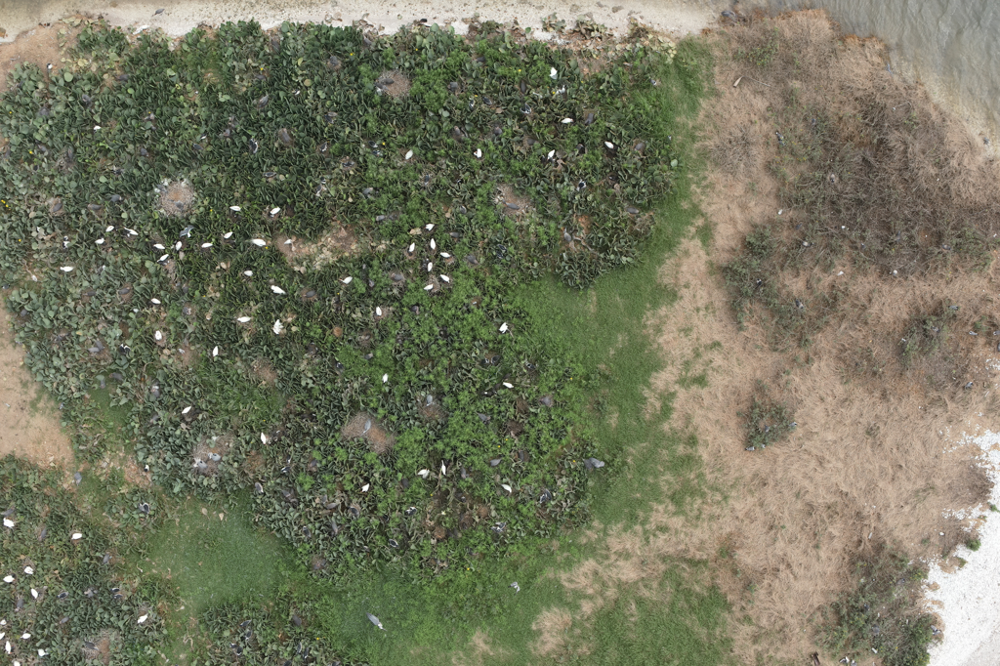

In [ ]:
# compress the high resolution image to reduce the space it occupies
high_res_image = Image.open('/content/database/detection/raw_data/annotated_images/DJI_20210517104803_0029.jpg')
ratio = 8
low_res_image = high_res_image.resize((8192 // ratio, 5460 // ratio))
low_res_image.show()

The `update_database()` function performs the following tasks:
  1. Segments drone images into non-overlapping tiles
  2. Updates the format and class names of annotations for original/tiled images in the database
  3. Generates histograms for bird species classes
  4. Crops birds down to bounding boxes (used to train the species classifier)
  5. Splits cropped birds into training, test and validation sets

Finished writing csv files
Finished writing csv files
Number of classes:  23
Finished adding class_id column and plotting distribution of classes
Number of classes:  23
Finished adding class_id column and plotting distribution of classes
Finished cropping images


Copying files: 23078 files [00:02, 8517.42 files/s]


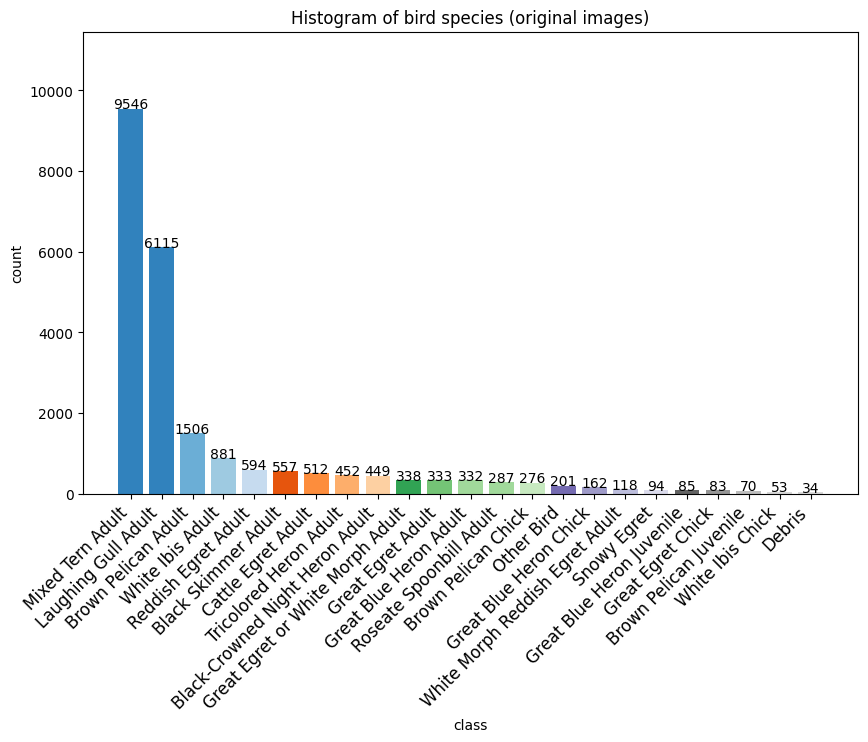

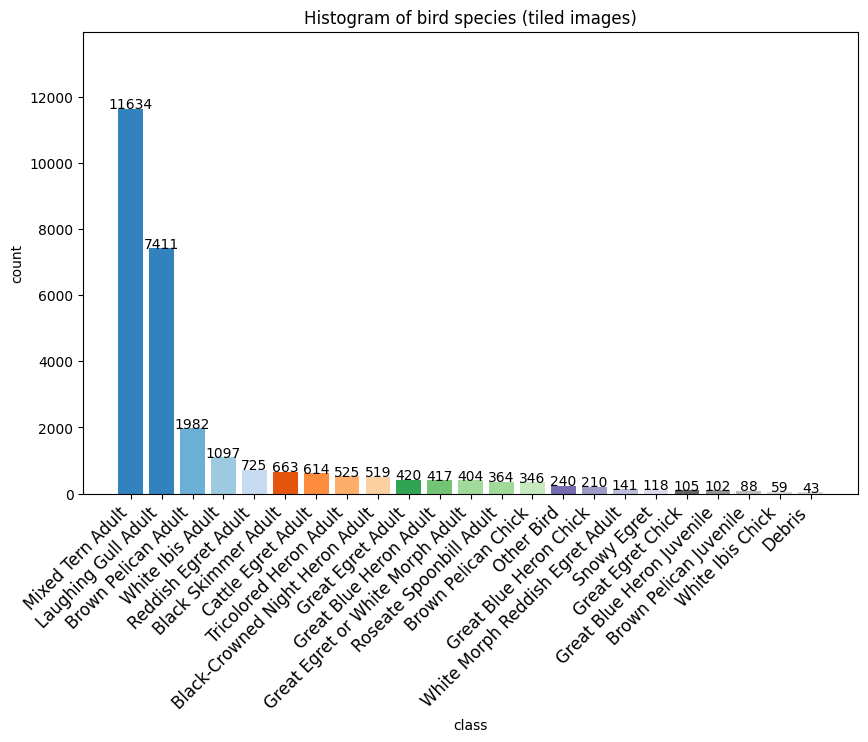

In [ ]:
# Update database (takes a few minutes)
update_database()

Here's a look at a tiled drone image paired with its annotations:

In [27]:
pd.read_csv('/content/database/detection/tiled_data/annotations_xxyy/DJI_20210517104803_0029_0_0.csv').head(10)

,class_id,class_name,xmax,xmin,ymax,ymin
0,1,Black-Crowned Night Heron Adult,438,370,575,518
1,1,Black-Crowned Night Heron Adult,536,488,624,548


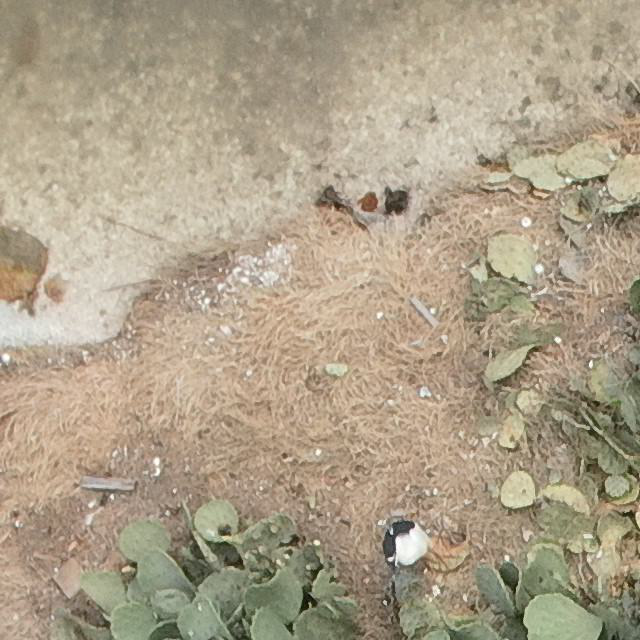

In [28]:
Image.open('/content/database/detection/tiled_data/annotated_images/DJI_20210517104803_0029_0_0.jpg')

Here's a look at a cropped bird (used as input for the classifier):

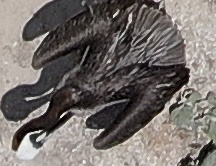

In [29]:
Image.open('/content/database/cropped/Brown Pelican Adult/100_2358_5040.jpg')

## Part 3 - Training the Bird Detector

The `train_detector_pipeline()` function performs the following tasks:
  1. Splits the dataset into train, validation and test sets based on user input
  2. Trains a bird detection model using a Faster R-CNN architecture with hyperparameters: batch size = 8, learning rate = 0.0001
  3. Plots evaluation metrics during training epochs
  4. Displays examples of localized birds in tiled images

  **NOTE: For this demo, the model is being trained on a smaller data sample.**

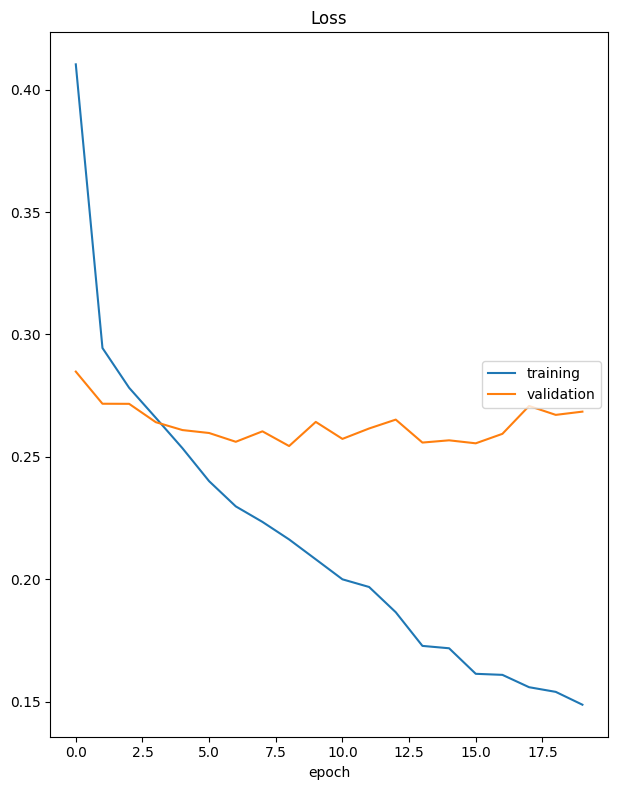

Loss
	training         	 (min:    0.149, max:    0.410, cur:    0.149)
	validation       	 (min:    0.254, max:    0.285, cur:    0.268)


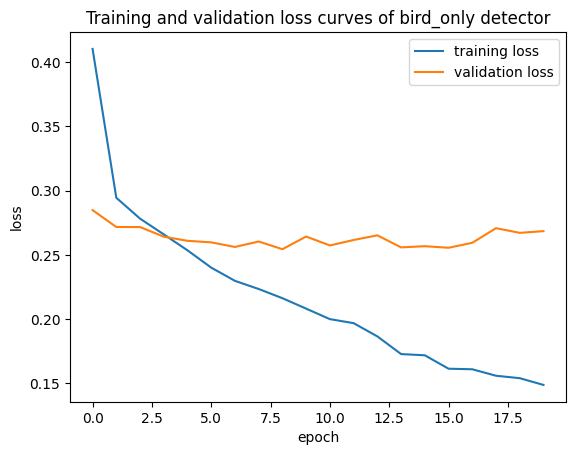

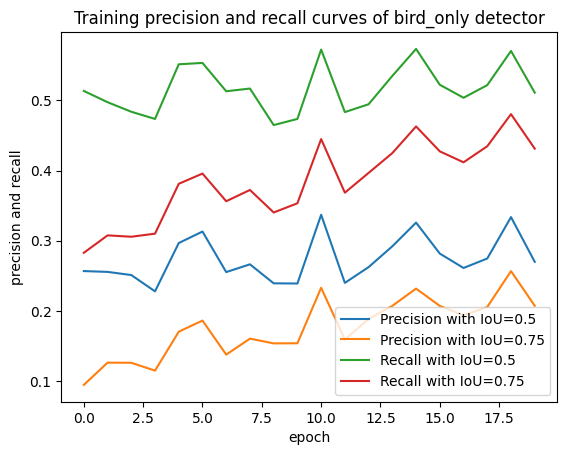

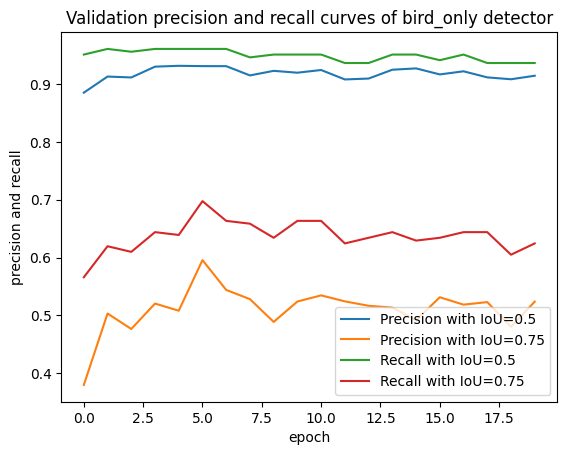

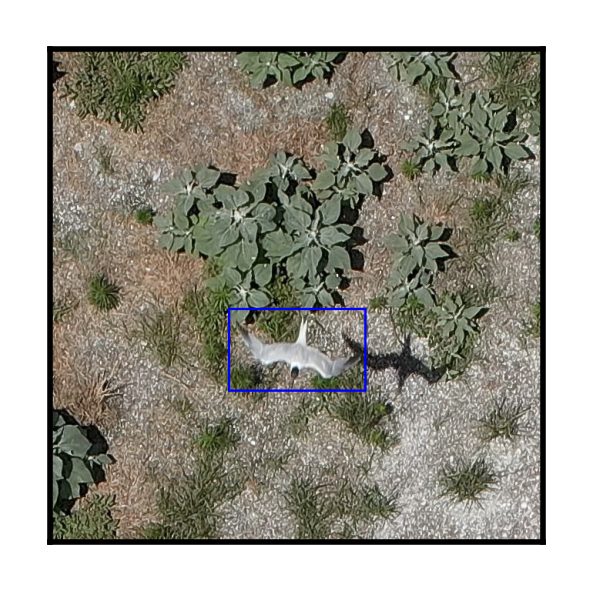

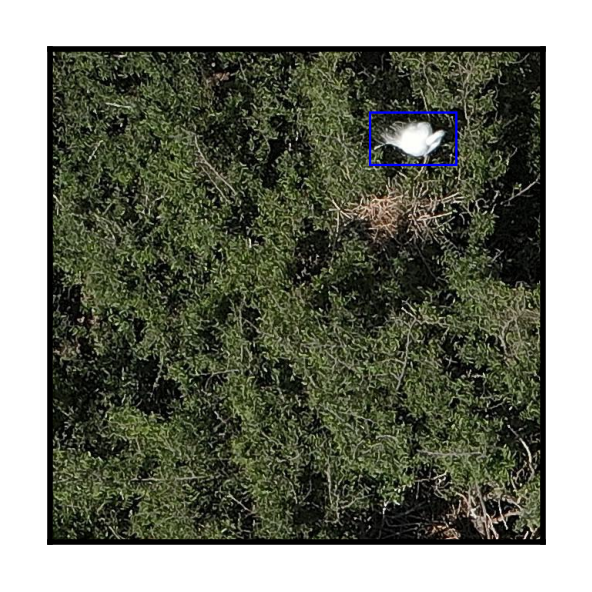

...

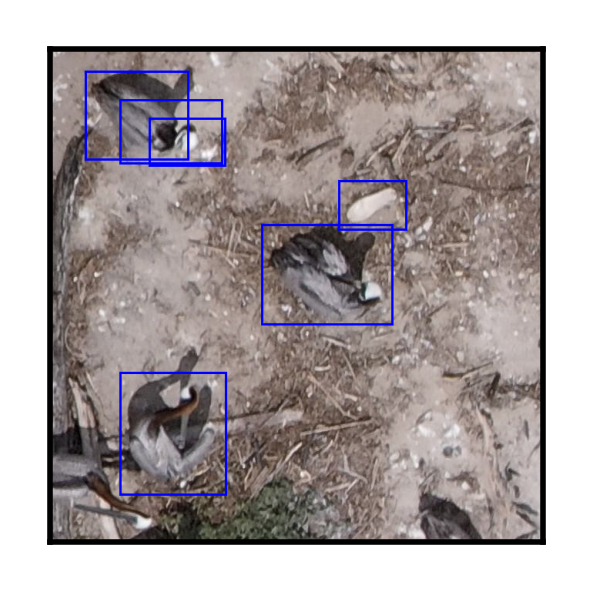

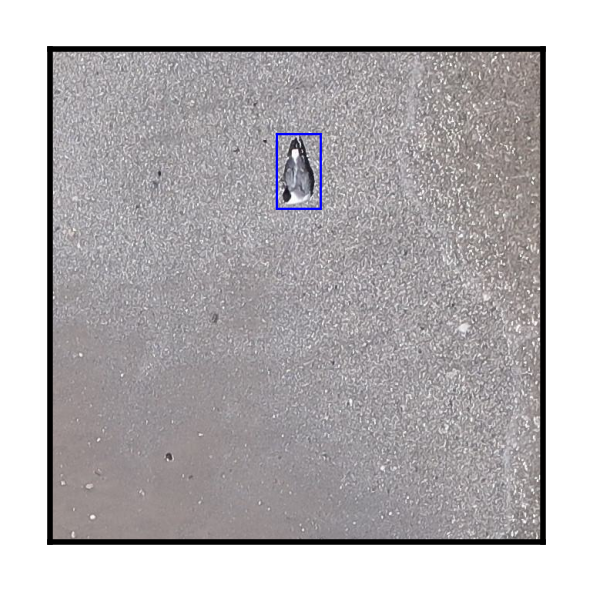

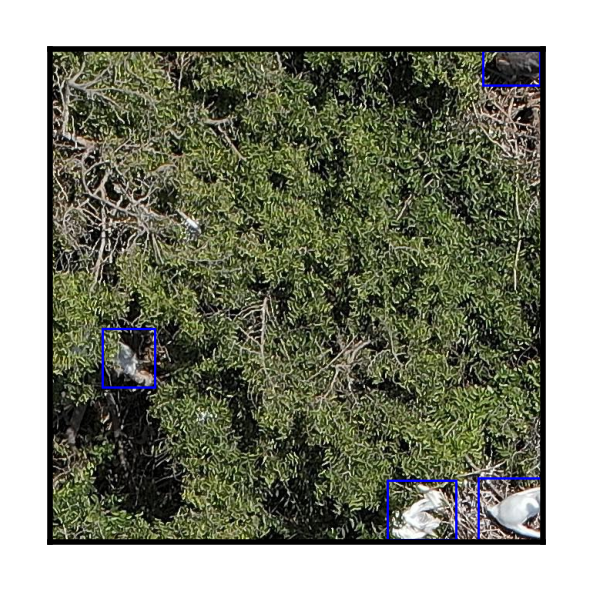

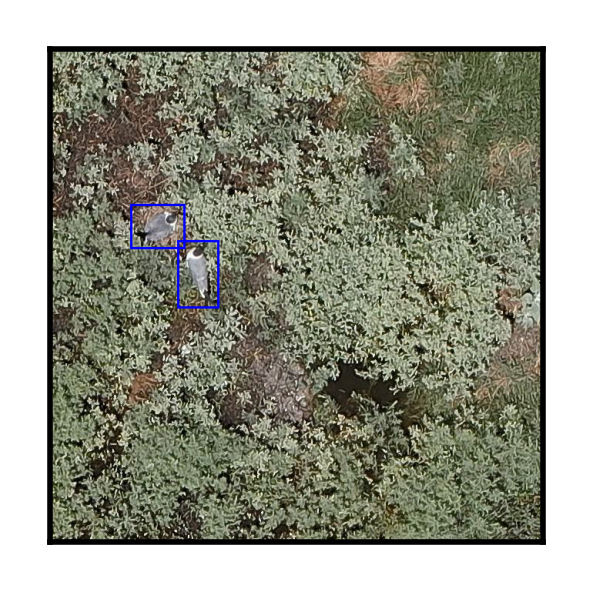

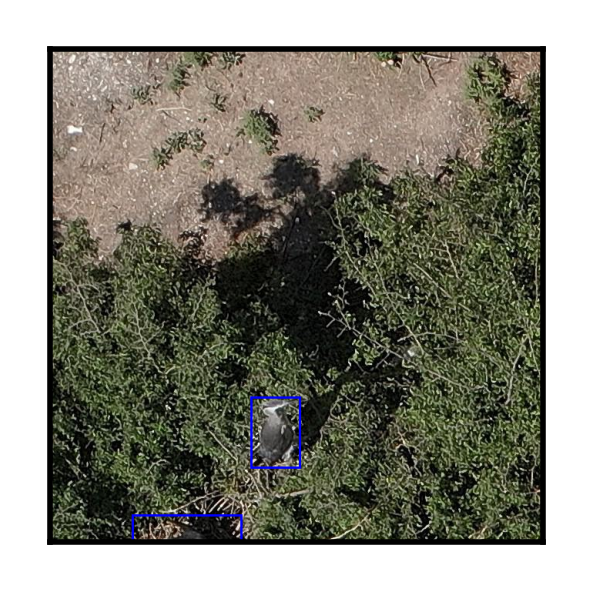

In [ ]:
# Train detector
# The detector is trained on a small subset of the database for debugging purpose
# NOTE that if you want to train on the entire dataset, let SUBSET = False
SUBSET = True
split_ratio = (0.08, 0.01, 0.01) if SUBSET else CONFIG_DETECTOR['data_split']
train_detector_pipeline(TILED_NEW_CSV_PATH, TILED_IMG_PATH,
                        split_ratio, CONFIG_DETECTOR['batch_size'], CONFIG_DETECTOR['model'][1],
                        HYPERPARAMS_DETECTOR['l_r'], HYPERPARAMS_DETECTOR['num_epoch'], CONFIG_DETECTOR['model'][0])

## Part 4 - Training the Species Classifier

The `train_classifier_pipeline()` function performs the following tasks:
  1. Trains an image classification model using a ResNet50 model with hyperparameters: batch size = 32, learning rate = 0.0001.
  2. Plots evaluation metrics during training epochs
  3. Generates a confusion matrix displaying model predictions for each species class

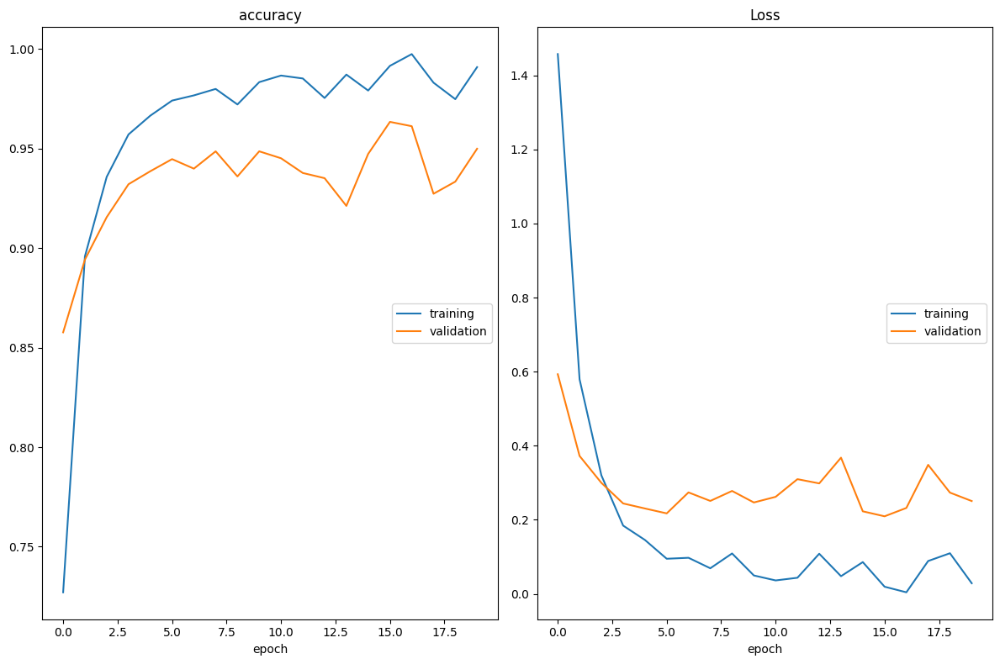

accuracy
	training         	 (min:    0.727, max:    0.998, cur:    0.991)
	validation       	 (min:    0.858, max:    0.963, cur:    0.950)
Loss
	training         	 (min:    0.004, max:    1.458, cur:    0.029)
	validation       	 (min:    0.209, max:    0.593, cur:    0.251)


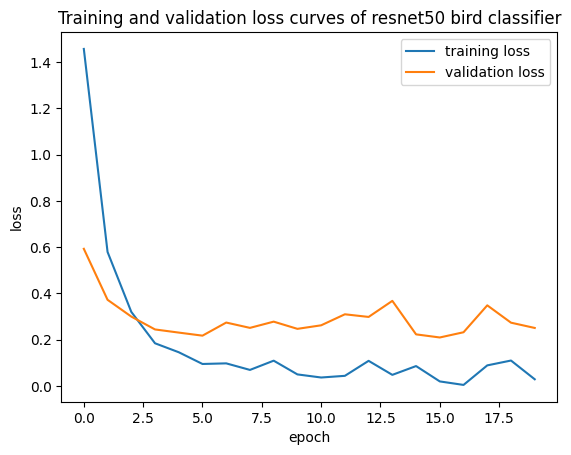

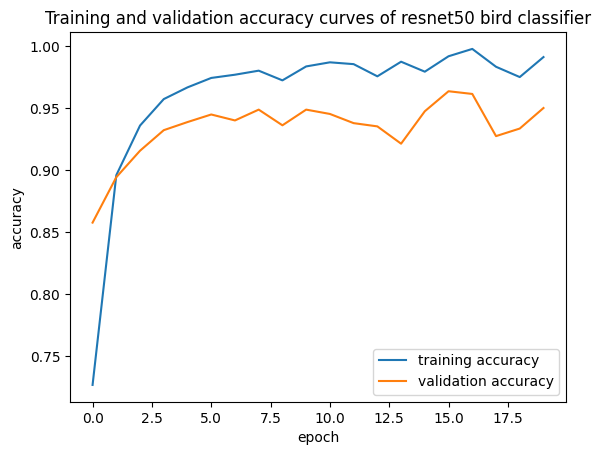

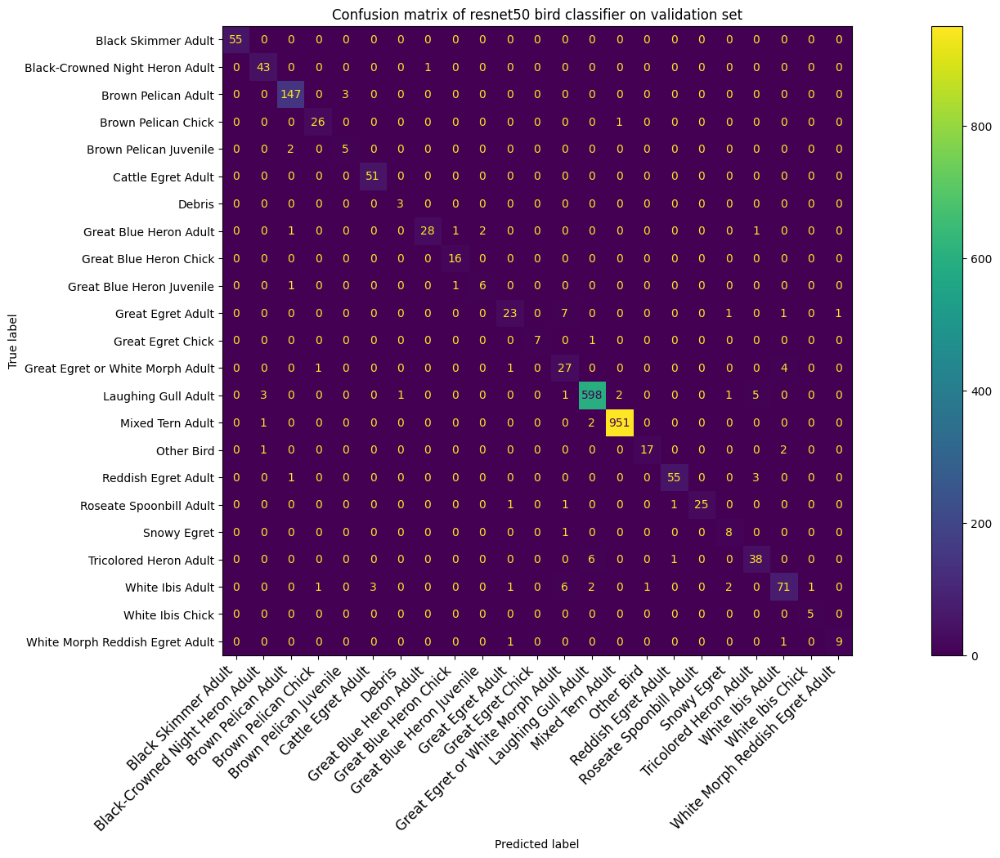

In [ ]:
# Train classifier
train_classifier_pipline(CROPPED_PATH, CLF_TRAIN_PATH, CLF_VAL_PATH,
                         CONFIG_CLASSIFIER['batch_size'], HYPERPARAMS_CLASSIFIER['num_epoch'],
                         CONFIG_CLASSIFIER['model'], CLASSIFIER_PATH, DEVICE, HYPERPARAMS_CLASSIFIER['l_r'])